<a href="https://www.kaggle.com/code/aarony1n/deepfake-detection?scriptVersionId=142577432" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

* **Title** 

    using RNN's & CNN's to deal with Deepfake video

* **Problem** 

    深偽技術(Deepfake)是基於人工智慧中的圖像合成技巧所衍伸出來的技術,通過換臉達到偽造身分的目的,進而融合生成式對抗網路(GAN)的技巧,產生人臉再進行替換.

* **Purpose** 
    
    訓練模型以辨認影像中的物體是否為Deepfake所產生的結果(REAL/FAKE)

* **Dataset** 

    1. train_sample_videos.zip - a ZIP file containing a sample set of training videos and a metadata.json with labels. the full set of training videos is available through the links provided above.
    2. sample_submission.csv - a sample submission file in the correct format.
    3. test_videos.zip - a zip file containing a small set of videos to be used as a public validation set.

In [1]:
!pip install -U --upgrade tensorflow

     |████████████████████████████████| 458.3MB 32kB/s 
     |████████████████████████████████| 14.8MB 62.1MB/s 
     |████████████████████████████████| 133kB 63.8MB/s 
     |████████████████████████████████| 61kB 6.1MB/s 
     |████████████████████████████████| 471kB 58.4MB/s 
     |████████████████████████████████| 1.3MB 45.2MB/s 
     |████████████████████████████████| 5.6MB 63.8MB/s 
     |████████████████████████████████| 71kB 6.7MB/s 
     |████████████████████████████████| 4.0MB 63.6MB/s 
     |████████████████████████████████| 4.6MB 42.7MB/s 
     |████████████████████████████████| 51kB 3.9MB/s 
     |████████████████████████████████| 4.9MB 54.1MB/s 
     |████████████████████████████████| 788kB 39.8MB/s 
  Created wheel for clang: filename=clang-5.0-cp36-none-any.whl size=30705 sha256=70dff0d56b124ef8a53682bab07e6f814434c7ce5e4ab4ba962589f4c42162ca
  Stored in directory: /root/.cache/pip/wheels/a1/d0/fb/f47e814ad88e0741b0ff6fc57bc4044f61c44cb707a68de6b3
  Created wheel for wra

In [2]:
#導入相關套件
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

In [3]:
#導入資料/查看資料大小
DATA_FOLDER = '../input/deepfake-detection-challenge'
TRAIN_SAMPLE_FOLDER = 'train_sample_videos'
TEST_FOLDER = 'test_videos'

print(f"train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")
print(f"test samples: {len(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))}")

train samples: 401
test samples: 400


In [4]:
train_sample_metadata = pd.read_json('../input/deepfake-detection-challenge/train_sample_videos/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


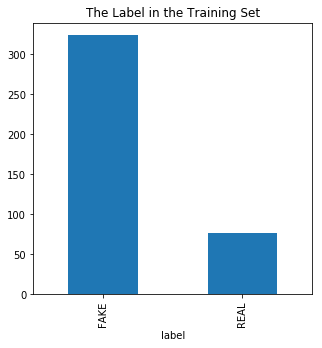

In [5]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(5,5),kind='bar',title='The Label in the Training Set')
plt.show()

In [6]:
#檢查檔案維度
train_sample_metadata.shape

(400, 3)

* **擷取影像** 

    將影像擷取成圖片處理(分成FAKE/REAL兩部分)

In [7]:
f_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(5).index)
f_train_sample_video

['dbhrpizyeq.mp4',
 'ehbnclaukr.mp4',
 'btmsngnqhv.mp4',
 'cdyakrxkia.mp4',
 'bsqgziaylx.mp4']

In [8]:
def capture_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize =(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

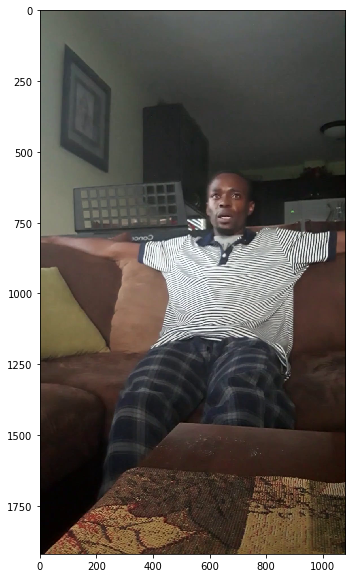

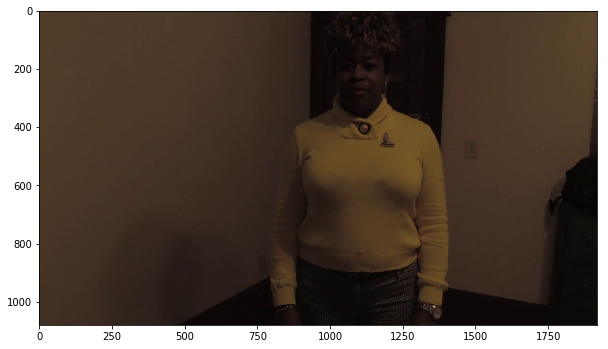

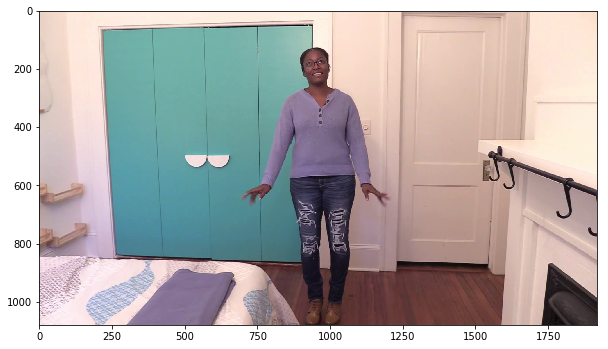

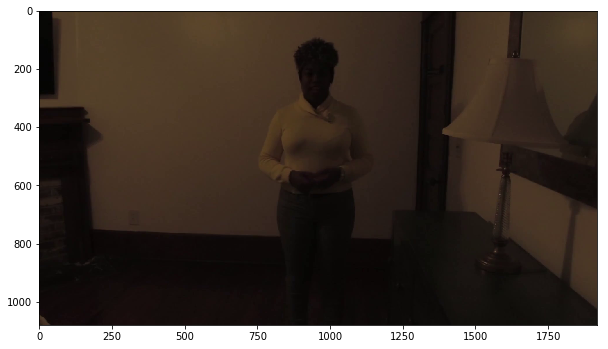

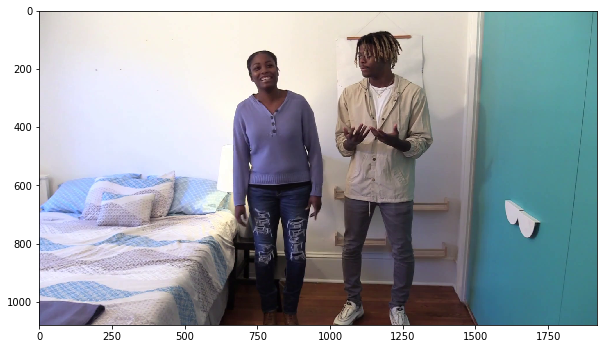

In [9]:
for video_file in f_train_sample_video:
    capture_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

In [10]:
r_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(5).index)
r_train_sample_video

['ahqqqilsxt.mp4',
 'abarnvbtwb.mp4',
 'dakiztgtnw.mp4',
 'agrmhtjdlk.mp4',
 'anpuvshzoo.mp4']

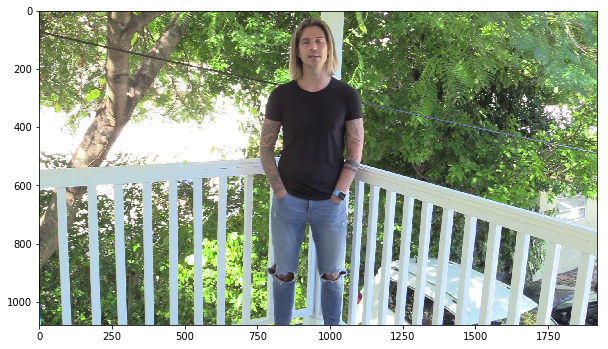

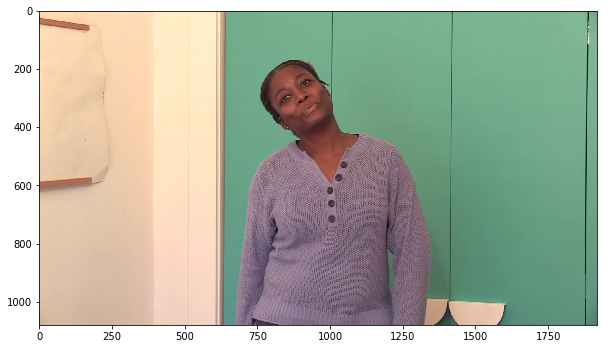

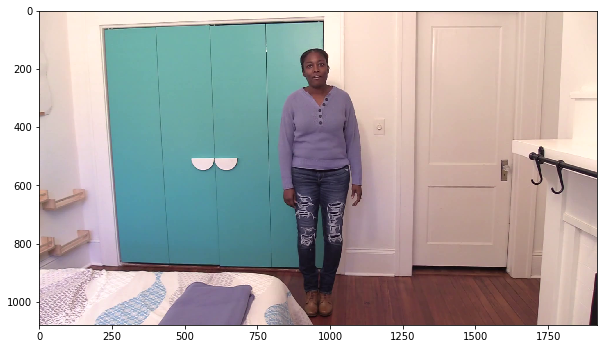

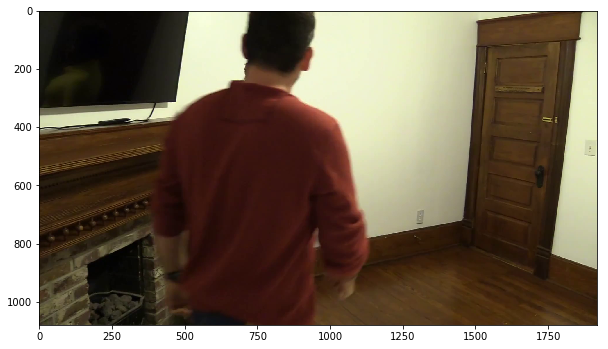

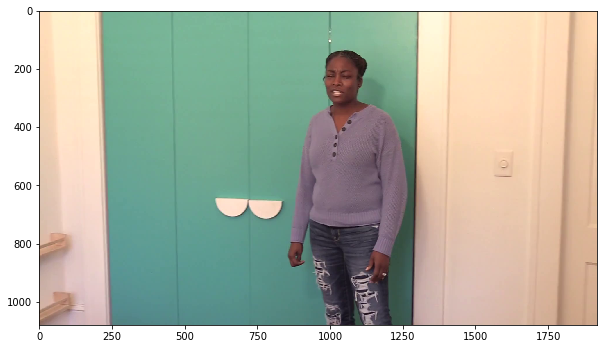

In [11]:
for video_file in r_train_sample_video:
    capture_image_from_video(os.path.join(DATA_FOLDER,TRAIN_SAMPLE_FOLDER,video_file))

* **檢視FAKE** 

    想從中找出fake跟real的分辨方式,訂定之後model的構築方向

In [12]:
f_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [13]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file,subset=TRAIN_SAMPLE_FOLDER):
    video_url = open(os.path.join(DATA_FOLDER,subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" %data_url)
play_video(f_videos[5])

經過多個影片的測試,有些很容易看出是fake,但有些卻完全難以靠肉眼分辨是否為fake

**Modelling**

In [14]:
img_size = 224
batch_size = 64
epochs = 15

max_seq_length = 20
num_features = 2048

In [15]:
def crop_center_square(frame):
    y,x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y :start_y + min_dim, start_x : start_x + min_dim]

def load_video(path, max_frames=0, resize=(img_size, img_size)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while 1:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)
            
            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)
    

In [16]:
def pretrain_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
    weights = "imagenet",
    include_top=False,
    pooling="avg",
    input_shape = (img_size,img_size,3)
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input
    
    inputs = keras.Input((img_size,img_size,3))
    preprocessed = preprocess_input(inputs)
    
    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = pretrain_feature_extractor()

87924736/87910968 [==============================] - 1s 0us/step


In [17]:
def prepare_all_videos(df, root_dir): #df是train_sample_metadata->json的split
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels=='FAKE').astype(np.int)
    
    frame_masks = np.zeros(shape=(num_samples, max_seq_length), dtype="bool") #array=360*20
    frame_features = np.zeros(
        shape=(num_samples, max_seq_length, num_features), dtype="float32" #array=360*20*2048
    )
    
    for idx, path in enumerate(video_paths):
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]
        
        temp_frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
        temp_frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")
        
        for i, batch in enumerate(frames):
            video_length = batch.shape[0] 
            length = min(max_seq_length, video_length) #if length is over 20s ,only cut 20s
            for j in range(length):
                temp_frame_features[i, j, :] =feature_extractor.predict(batch[None, j, :])
            temp_frame_mask[i, :length] =1 # 1 = not masked, 0 = masked ->give 1 when there are images ,otherwise 0 for padding
        
        frame_features[idx,] =temp_frame_features.squeeze() #squeeze array for training
        frame_masks[idx,] =temp_frame_mask.squeeze()
    
    return (frame_features, frame_masks), labels

In [18]:
from sklearn.model_selection import train_test_split

Train_set , Test_set = train_test_split(train_sample_metadata, test_size=0.1,random_state=42,
                                       stratify=train_sample_metadata['label'])
print(Train_set.shape, Test_set.shape)

(360, 3) (40, 3)


In [19]:
train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "test")

print(f"Frame features in train set:{train_data[0].shape}")
print(f"Frame masks in train set:{train_data[1].shape}")

Frame features in train set:(360, 20, 2048)
Frame masks in train set:(360, 20)


**Training(RNN)**

In [20]:
frame_features_input = keras.Input((max_seq_length, num_features))
mask_input = keras.Input((max_seq_length,),dtype="bool")

x = keras.layers.GRU(16, return_sequences=True)(frame_features_input, mask = mask_input)
x = keras.layers.GRU(8)(x)
x = keras.layers.Dropout(0.4)(x)
x = keras.layers.Dense(8, activation="relu")(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 20, 2048)]   0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            [(None, 20)]         0                                            
__________________________________________________________________________________________________
gru (GRU)                       (None, 20, 16)       99168       input_3[0][0]                    
                                                                 input_4[0][0]                    
__________________________________________________________________________________________________
gru_1 (GRU)                     (None, 8)            624         gru[0][0]                    

In [21]:
checkpoint = keras.callbacks.ModelCheckpoint('./', save_weights_only=True, save_best_only=True)
history = model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_data=([test_data[0], test_data[1]], test_labels),
        callbacks=[checkpoint],
        epochs=epochs,
        batch_size=8
)

Epoch 1/15
45/45 [==============================] - 8s 59ms/step - loss: 0.6868 - accuracy: 0.7972 - val_loss: 0.6808 - val_accuracy: 0.8000
Epoch 2/15
45/45 [==============================] - 1s 18ms/step - loss: 0.6748 - accuracy: 0.8083 - val_loss: 0.6695 - val_accuracy: 0.8000
Epoch 3/15
45/45 [==============================] - 1s 18ms/step - loss: 0.6634 - accuracy: 0.8083 - val_loss: 0.6587 - val_accuracy: 0.8000
Epoch 4/15
45/45 [==============================] - 1s 18ms/step - loss: 0.6525 - accuracy: 0.8083 - val_loss: 0.6489 - val_accuracy: 0.8000
Epoch 5/15
45/45 [==============================] - 1s 18ms/step - loss: 0.6424 - accuracy: 0.8083 - val_loss: 0.6390 - val_accuracy: 0.8000
Epoch 6/15
45/45 [==============================] - 1s 18ms/step - loss: 0.6328 - accuracy: 0.8083 - val_loss: 0.6296 - val_accuracy: 0.8000
Epoch 7/15
45/45 [==============================] - 1s 19ms/step - loss: 0.6234 - accuracy: 0.8083 - val_loss: 0.6215 - val_accuracy: 0.8000
Epoch 8/15
45

**Inference**

In [22]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

In [23]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
    frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(max_seq_length, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

def sequence_prediction(path):
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]
    
# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.5):
    print(f'The predicted class of the video is FAKE')
else:
    print(f'The predicted class of the video is REAL')

play_video(test_video,TEST_FOLDER)

Test video path: oojxonbgow.mp4
The predicted class of the video is FAKE
